# ETH/BTC Price Forecast Model
Analysis to determine the ideal model to predict future ETH prices.

In [288]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA

## Helper Functions

In [289]:
def adf_test(series):
    result = adfuller(series)
    print("ADF Statistic: %f" % result[0])
    print("p-value: %f" % result[1])

## Import Data

In [290]:
eth_btc = pd.read_csv("ETH-USD_1y200716d.csv", parse_dates=[0], index_col=0, squeeze=True)
eth_btc.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-07-16,238.450912,239.006256,231.621170,233.640884,233.640884,5.832058e+09
2020-07-17,233.691391,234.415070,232.109970,232.773087,232.773087,5.859851e+09
2020-07-18,232.855682,236.543976,232.324890,235.483810,235.483810,5.397402e+09
2020-07-19,235.458298,239.160690,233.279739,238.487518,238.487518,6.251377e+09
2020-07-20,238.494873,239.576248,234.852646,236.153168,236.153168,5.600686e+09


In [291]:
eth_btc_close = eth_btc.drop(columns=["Open", "High", "Low", "Adj Close", "Volume"]).dropna()
eth_btc_close.head()

,Close
Date,
2020-07-16,233.640884
2020-07-17,232.773087
2020-07-18,235.483810
2020-07-19,238.487518
2020-07-20,236.153168


In [292]:
eth_btc_open = eth_btc.drop(columns=["High", "Low", "Close", "Adj Close", "Volume"]).dropna()
eth_btc_open.head()

,Open
Date,
2020-07-16,238.450912
2020-07-17,233.691391
2020-07-18,232.855682
2020-07-19,235.458298
2020-07-20,238.494873


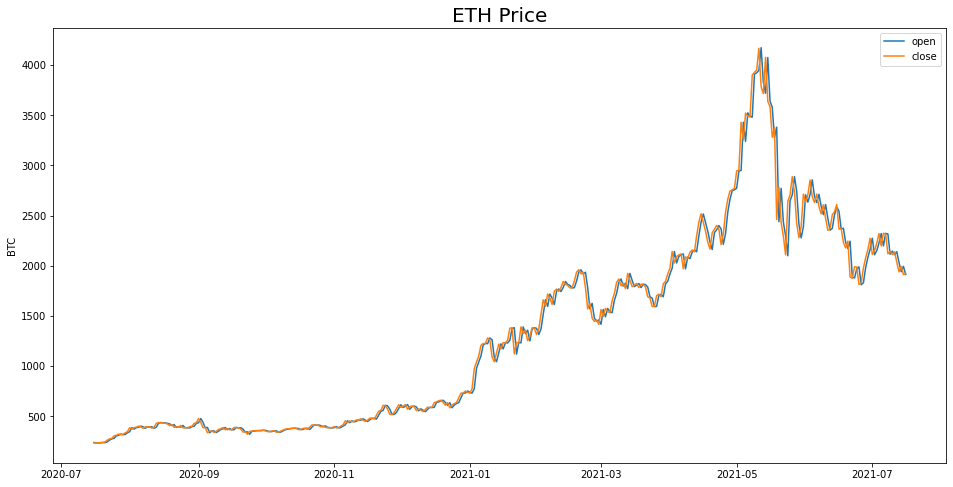

In [293]:
plt.figure(figsize=(16, 8))
plt.title("ETH Price", fontsize=20)
plt.ylabel("BTC")
plt.plot(eth_btc_open.Open, label="open")
plt.plot(eth_btc_close.Close, label="close")
plt.legend()

## Normalization

In [294]:
mean_open, std_open = eth_btc_open.Open.mean(), eth_btc_open.Open.std()
mean_close, std_close = eth_btc_close.Close.mean(), eth_btc_close.Close.std()

eth_btc_open["Open"] = (eth_btc_open.Open - mean_open) / std_open
eth_btc_close["Close"] = (eth_btc_close.Close - mean_close) / std_open

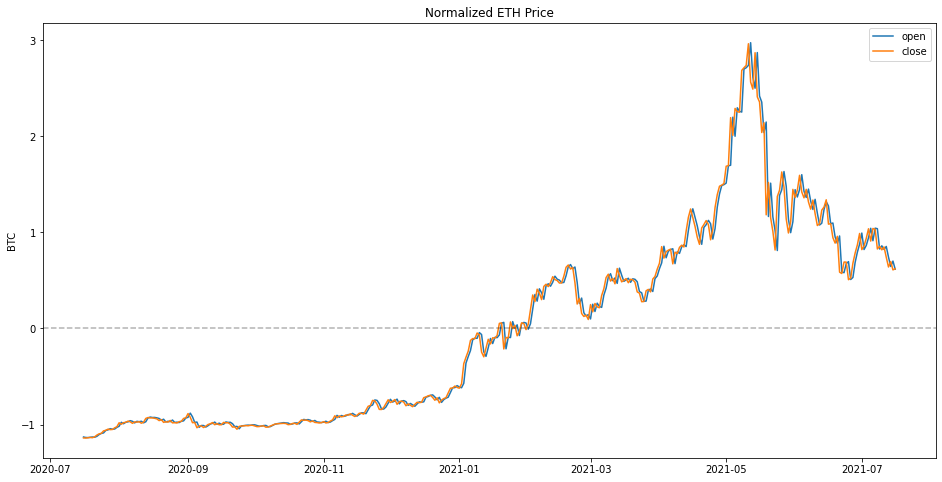

In [295]:
plt.figure(figsize=(16, 8))
plt.title("Normalized ETH Price")
plt.ylabel("BTC")
plt.plot(eth_btc_open.Open, label="open")
plt.plot(eth_btc_close.Close, label="close")
plt.legend()
plt.axhline(y=0, linestyle='--', color='k', alpha=0.3)

In [296]:
eth_btc_change = pd.DataFrame()
eth_btc_change["Change"] = eth_btc_close.Close - eth_btc_open.Open

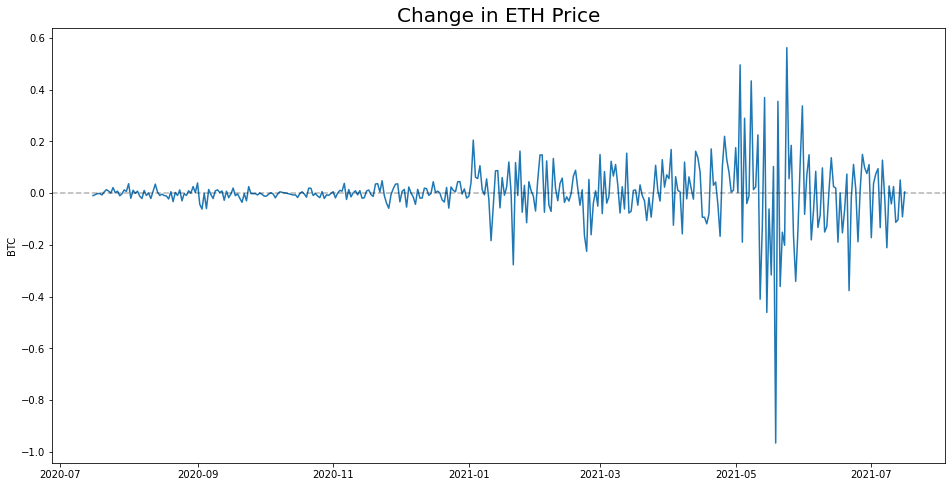

In [297]:
plt.figure(figsize=(16, 8))
plt.title("Change in ETH Price", fontsize=20)
plt.ylabel("BTC")
plt.plot(eth_btc_change.Change)
plt.axhline(y=0, linestyle='--', color='k', alpha=0.3)

In [298]:
adf_test(eth_btc_change.Change.dropna())

ADF Statistic: -5.968655
p-value: 0.000000


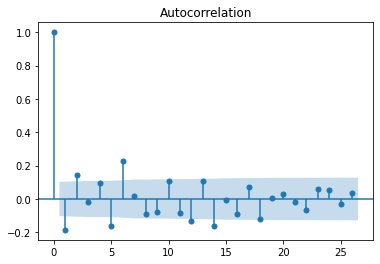

In [299]:
plot_acf(eth_btc_change.Change.dropna())
plt.show()

## MA(1), MA(2), MA(5), MA(6), MA(12), MA(14), MA(18)

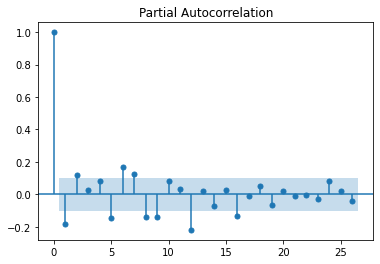

In [300]:
plot_pacf(eth_btc_change.Change.dropna())
plt.show()

## AR(1), AR(2), AR(5), AR(6), AR(7), AR(8), AR(9), AR(12), AR(16)

## ARMA(1, 1), ARMA(1, 2), ARMA(1, 5), ARMA(1, 6), ARMA(1, 12), ARMA(1, 14), ARMA(1, 18),
## ARMA(2, 1), ARMA(2, 2), ARMA(2, 5), ARMA(2, 6), ARMA(2, 12), ARMA(2, 14), ARMA(2, 18),
## ARMA(5, 1), ARMA(5, 2), ARMA(5, 5), ARMA(5, 6), ARMA(5, 12), ARMA(5, 14), ARMA(5, 18),
## ARMA(6, 1), ARMA(6, 2), ARMA(6, 5), ARMA(6, 6), ARMA(6, 12), ARMA(6, 14), ARMA(6, 18),
## ARMA(7, 1), ARMA(7, 2), ARMA(7, 5), ARMA(7, 6), ARMA(7, 12), ARMA(7, 14), ARMA(7, 18),
## ARMA(8, 1), ARMA(8, 2), ARMA(8, 5), ARMA(8, 6), ARMA(8, 12), ARMA(8, 14), ARMA(8, 18),
## ARMA(9, 1), ARMA(9, 2), ARMA(9, 5), ARMA(9, 6), ARMA(9, 12), ARMA(9, 14), ARMA(9, 18),
## ARMA(12, 1), ARMA(12, 2), ARMA(12, 5), ARMA(12, 6), ARMA(12, 12), ARMA(12, 14), ARMA(12, 18),
## ARMA(16, 1), ARMA(16, 2), ARMA(16, 5), ARMA(16, 6), ARMA(16, 12), ARMA(16, 14), ARMA(16, 18)

In [301]:
p_params = [1, 2, 5, 6, 7, 8, 9, 12, 16]
q_params = [1, 2, 5, 6, 12, 14, 18]

C:\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
C:\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
C:\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
C:\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored

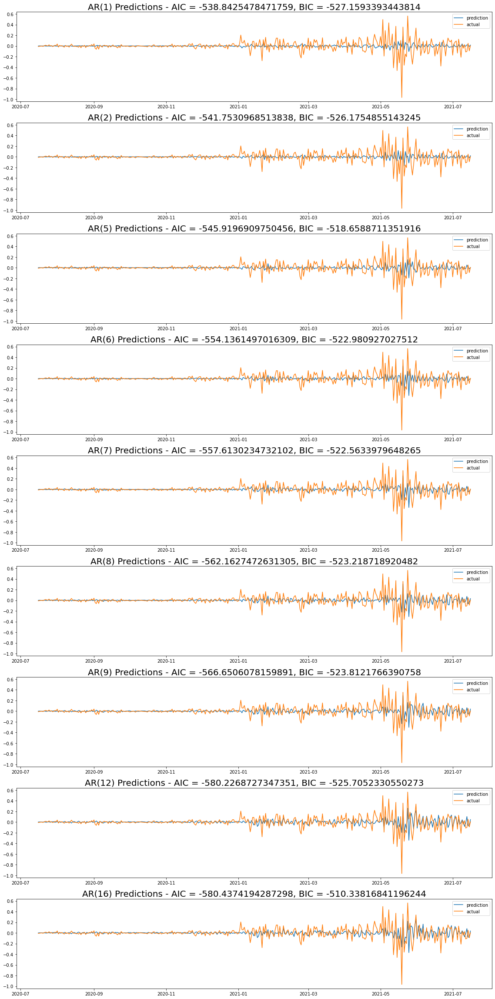

In [306]:
plt.figure(figsize=(16, 32))
for i, p in enumerate(p_params):
    model = ARIMA(eth_btc_change.Change, order=(p, 0, 0))
    model_fit = model.fit()
    plt.subplot(len(p_params), 1, i + 1)
    plt.title("AR(%s) Predictions - AIC = %s, BIC = %s" % (p, model_fit.aic, model_fit.bic), fontsize=20)
    plt.plot(model_fit.fittedvalues, label="prediction")
    plt.plot(eth_btc_change.Change, label="actual")
    plt.legend()
plt.tight_layout()

C:\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
C:\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
C:\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
C:\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored

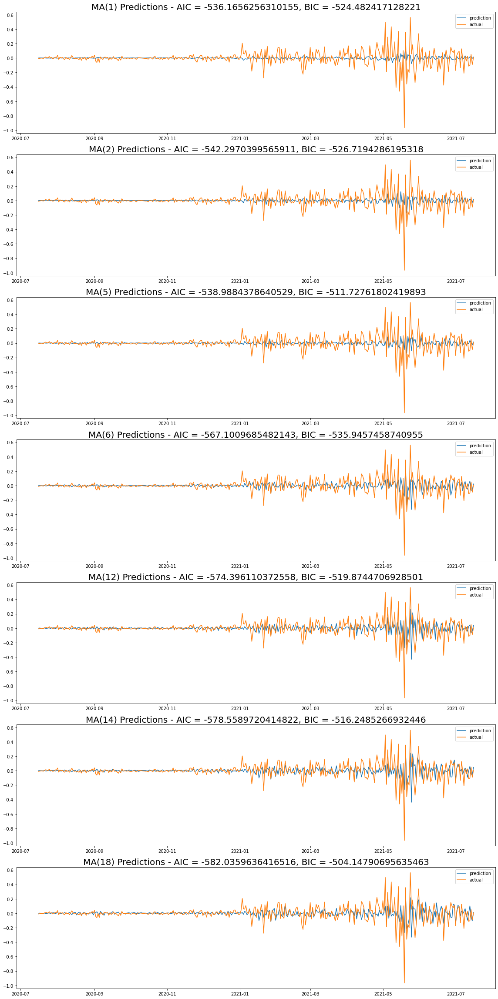

In [307]:
plt.figure(figsize=(16, 32))
for i, q in enumerate(q_params):
    model = ARIMA(eth_btc_change.Change, order=(0, 0, q))
    model_fit = model.fit()
    plt.subplot(len(q_params), 1, i + 1)
    plt.title("MA(%s) Predictions - AIC = %s, BIC = %s" % (q, model_fit.aic, model_fit.bic), fontsize=20)
    plt.plot(model_fit.fittedvalues, label="prediction")
    plt.plot(eth_btc_change.Change, label="actual")
    plt.legend()
plt.tight_layout()

site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
C:\Python39\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
C:\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but

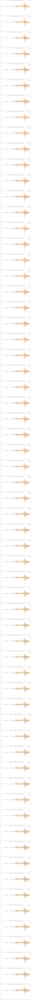

In [310]:
plt.figure(figsize=(16, 512))
idx = 0
for i, p in enumerate(p_params):
    for j, q in enumerate(q_params):
        idx += 1
        model = ARIMA(eth_btc_change.Change, order=(p, 0, q))
        model_fit = model.fit()
        plt.subplot(len(p_params) * len(q_params), 1, idx)
        plt.title("ARMA(%s, %s) Predictions - AIC = %s, BIC = %s" % (p, q, model_fit.aic, model_fit.bic))
        plt.plot(model_fit.fittedvalues, label="prediction")
        plt.plot(eth_btc_change.Change, label="actual")
        plt.legend()
plt.tight_layout()